In [31]:
from datetime import datetime
from astropy.table import Table,QTable
from astropy.io import fits,ascii
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import matplotlib.axes as axes
import numpy as np
import make_postage_stamps as mps
from astropy.visualization import simple_norm
from matplotlib.backends.backend_pdf import PdfPages
from photutils.isophote import Ellipse
import os

import warnings
warnings.filterwarnings("ignore")

In [32]:
#imported data directories:
data_dir=f'results/data_sample/'
cuts_dir=f'results/make_postage_stamps/F200W/'
cuts_dir_2=f'results/make_postage_stamps/F444W/'

#results saved in directory:
res_dir=f'results/morphology/'

We now import the data sample that will be analyzed, located in data_dir. 

In [33]:
table=data_dir+f'data_sample_table_z-3-4.ecsv'

data_sample = ascii.read(table) 
print(len(data_sample))

110


We now have to open all fits files in cuts_dir to represent the galaxies. We must remove all images that have no information.

In [34]:
# list to store files
cuts = []

# Iterate directory
for path in os.listdir(cuts_dir):
    # check if current path is a file
    if os.path.isfile(os.path.join(cuts_dir, path)):
        cuts.append(path)

#we remove images that have no information:
#for image in cuts:
 #   hdu_image=fits.open(cuts_dir+f'{image}')
  #  if (np.min(hdu_image[1].data)==np.max(hdu_image[1].data)):
   #     cuts.remove(image)

print(len(cuts))

110


To the header of each cut, we add the information about its ID, RA, DEC, z and Re

In [35]:
import re

gal_id=[]
ra=[]
dec=[]
z=[]
ref_200=[]
ref_444=[]

num=[]

for file in cuts:
    #select header of file:
    image=cuts_dir+f"{file}"
    hdu_image=fits.open(image)
    header=hdu_image[1].header
    
    #find id of file:
    num=re.findall(r'\d+',file)
    num_int=int(num[0])

    #find equivalent ID from data sample:
    for i in range(len(data_sample)):
        if data_sample['ID'][i]==num_int:
            gal_id.append(data_sample['ID'][i])
            ra.append(data_sample['RA'][i])
            dec.append(data_sample['DEC'][i])
            z.append(data_sample['z'][i])
            ref_200.append(data_sample['Re_F200W'][i].value)
            ref_444.append(data_sample['Re_F444W'][i].value)

table=QTable()
table['ID']=gal_id
table['RA']=ra
table['DEC']=dec
table['z']=z
table['Re_F200W']=ref_200
table['Re_F444W']=ref_444

table_final=table[np.argsort(table['z'])]

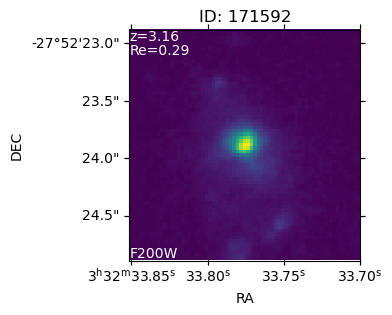

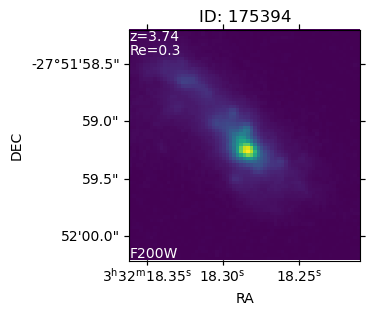

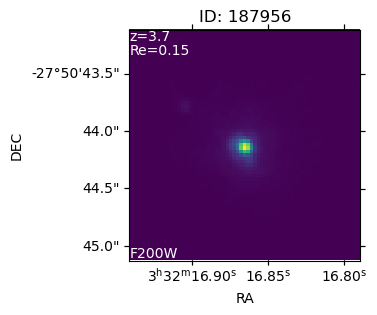

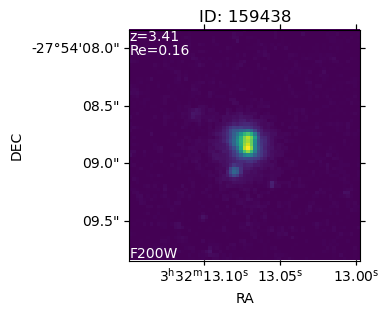

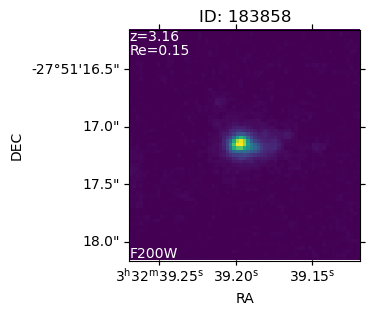

...

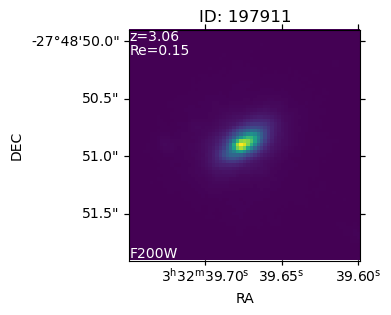

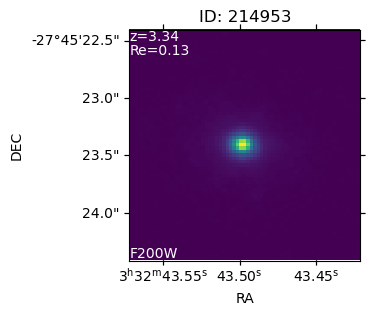

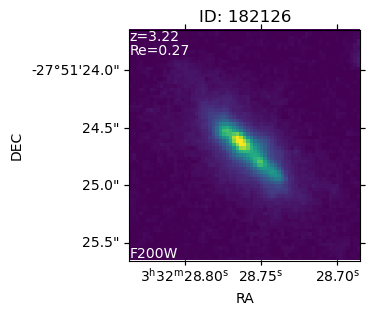

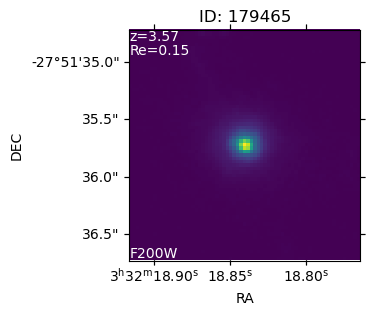

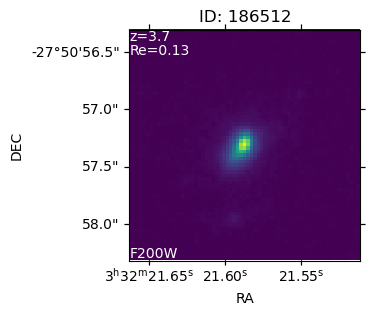

In [6]:
it=0

for file in cuts:
    
    #data from file:
    image=cuts_dir+f"{file}"
    hdu_image=fits.open(image)
    header=hdu_image[1].header
    wcs=WCS(header)
    
    #data to put in text:
    rs=z[it]
    r=ref_444[it]
    gid=gal_id[it]

    #normalization of data:
    #img_max=5e-1
    img_max=np.max(hdu_image[1].data)
    norm = simple_norm(hdu_image[1].data, 'log', log_a=2, min_cut=0, max_cut=img_max)
    
    #plotting figures:
    fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title(f'ID: {gid}')
    plt.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

    #text:
    text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
    plt.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
    plt.text(0, 0.94, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
    plt.text(0, 0.06, f'F200W', transform=ax.transAxes, **text_kwargs)
    
    plt.show()
    it=it+1

In [ ]:
cuts=[]
for i in range(len(table_final['ID'])):
    cuts.append(f'{

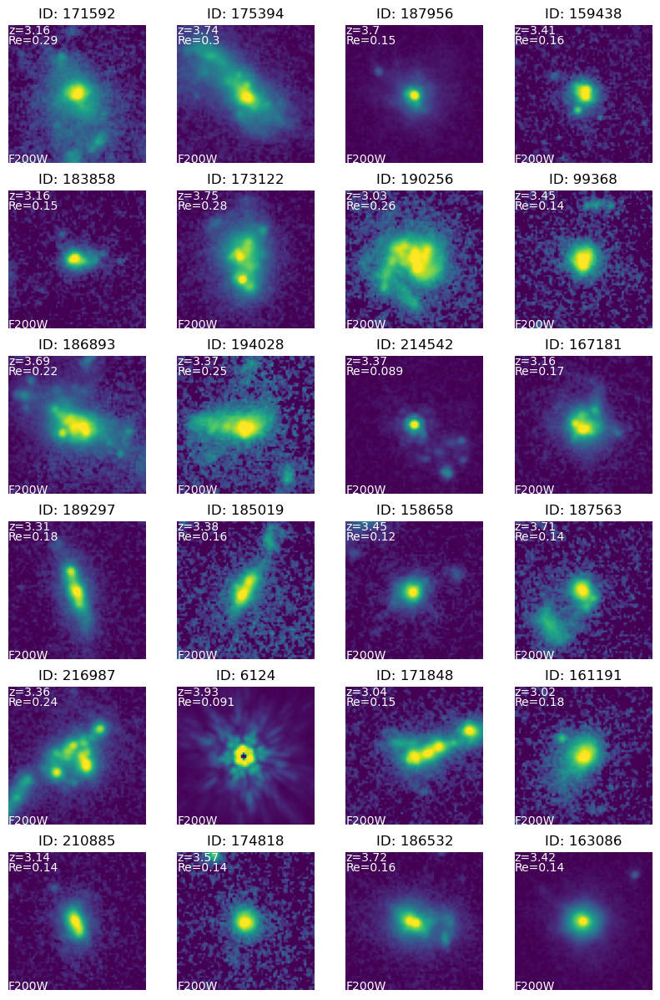

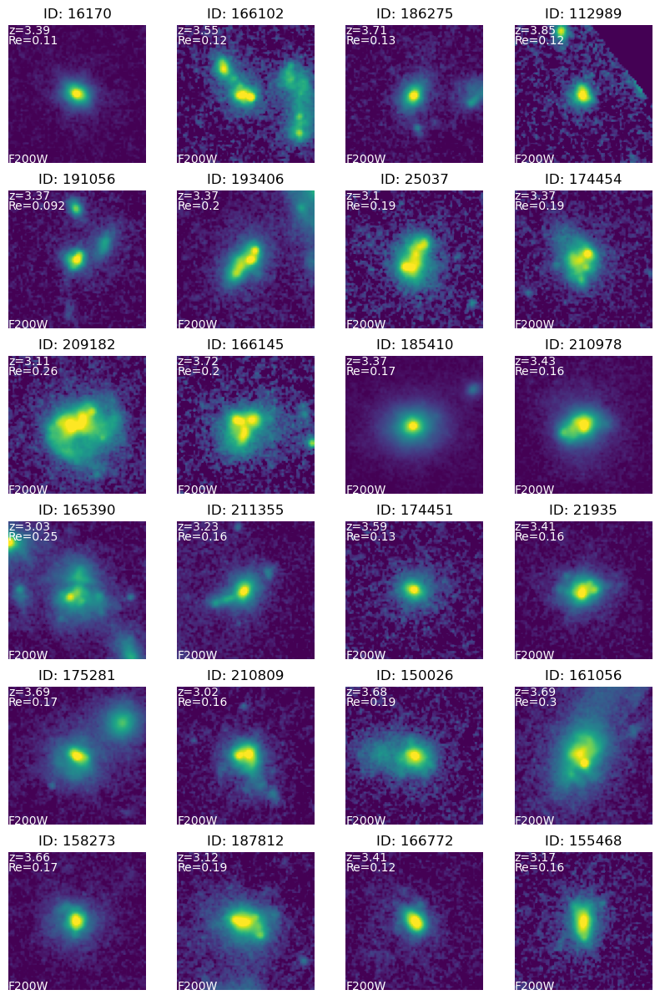

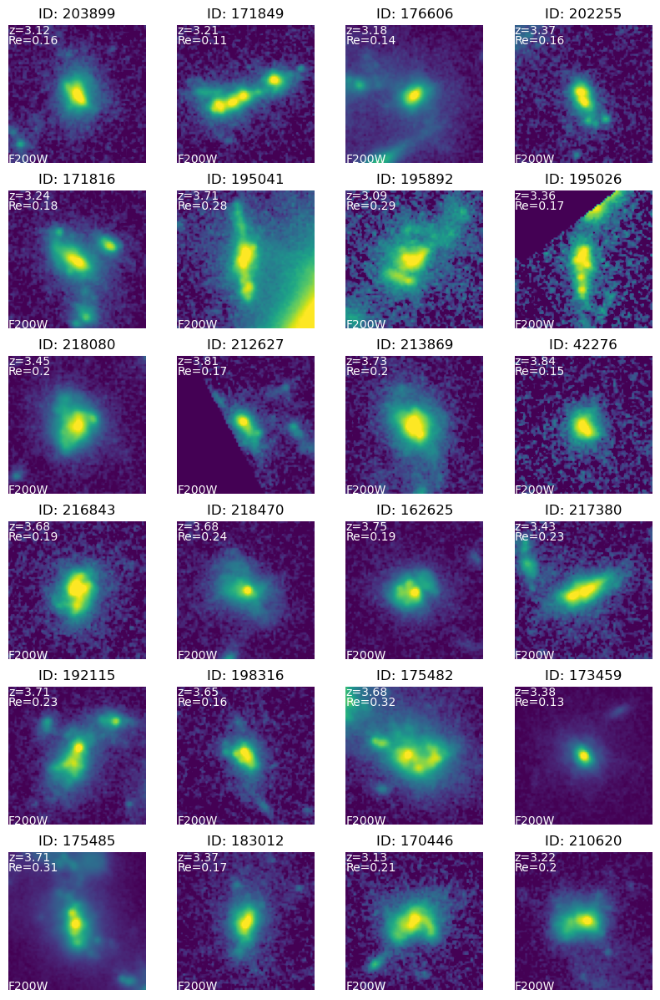

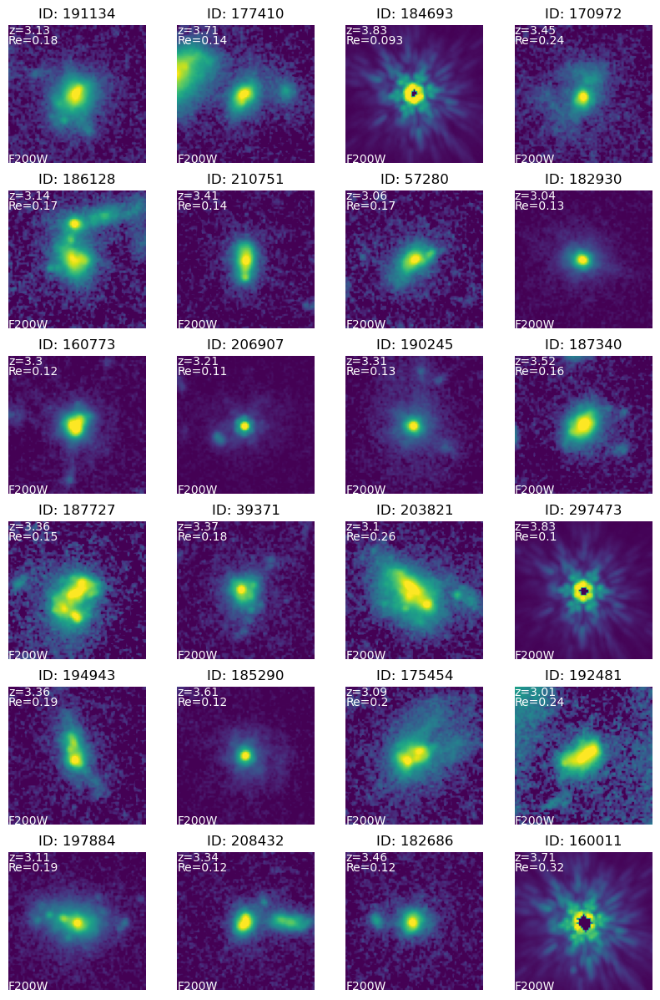

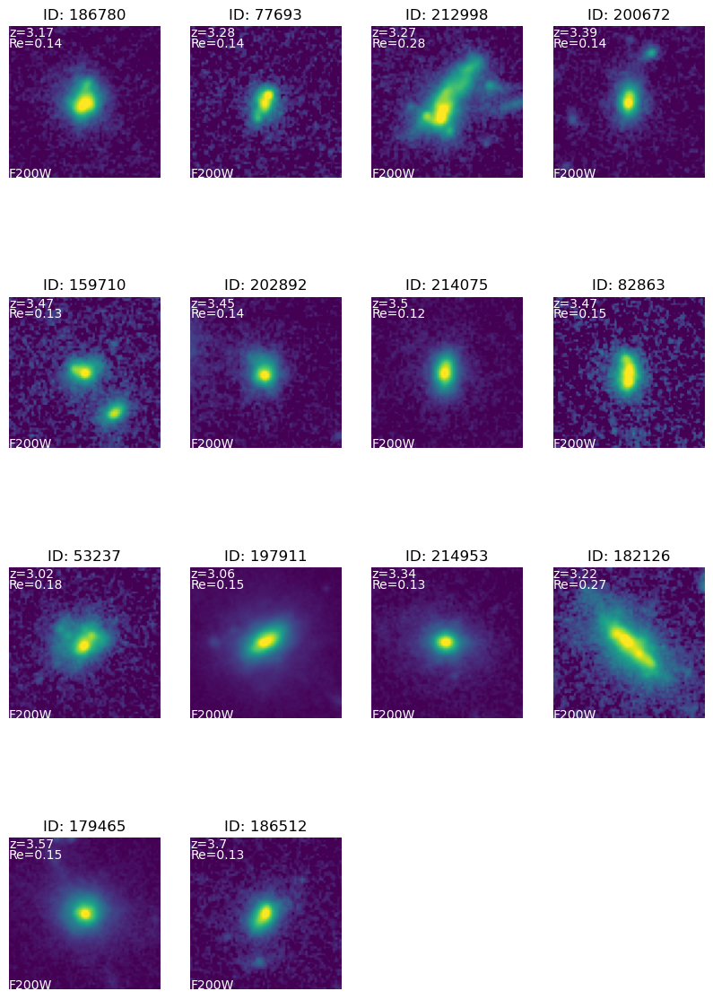

In [36]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F200W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_200[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        #ax.set_xlabel('RA')
        #ax.set_ylabel('DEC')
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F200W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_200[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_200[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_200[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_200[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F200W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

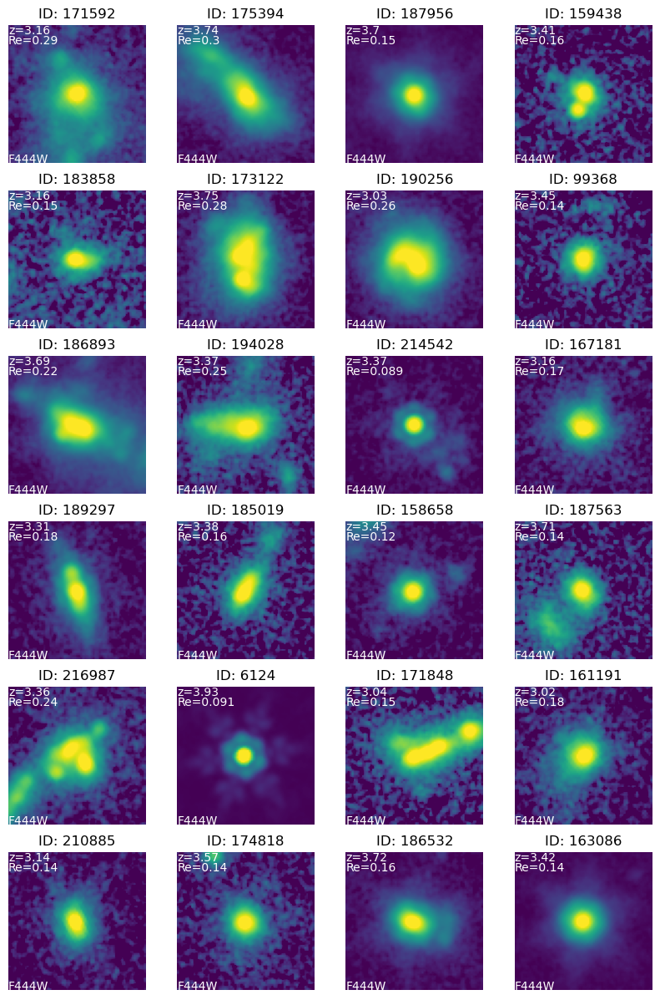

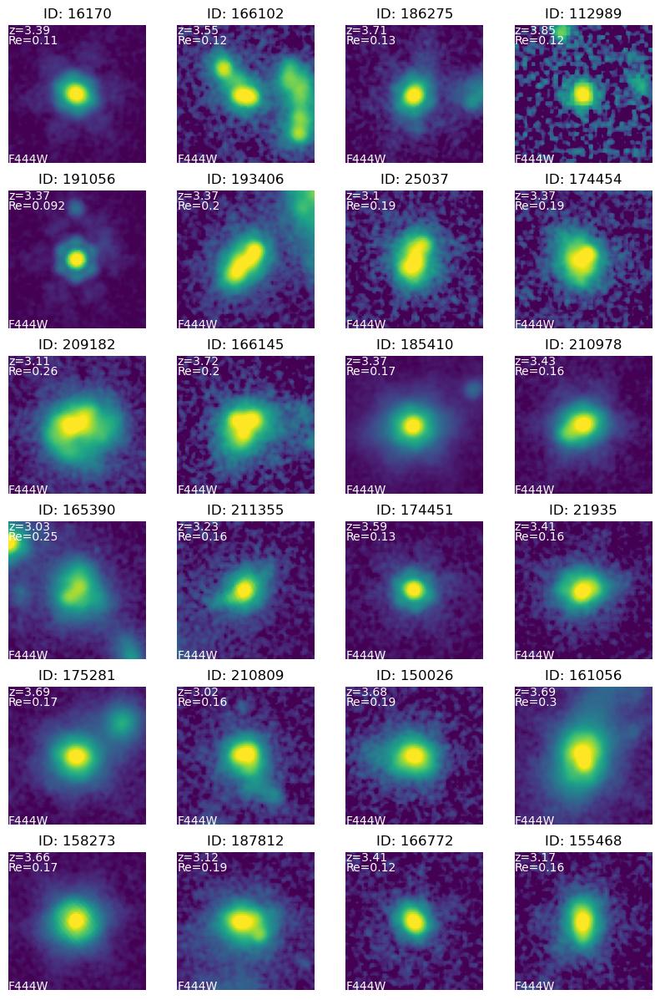

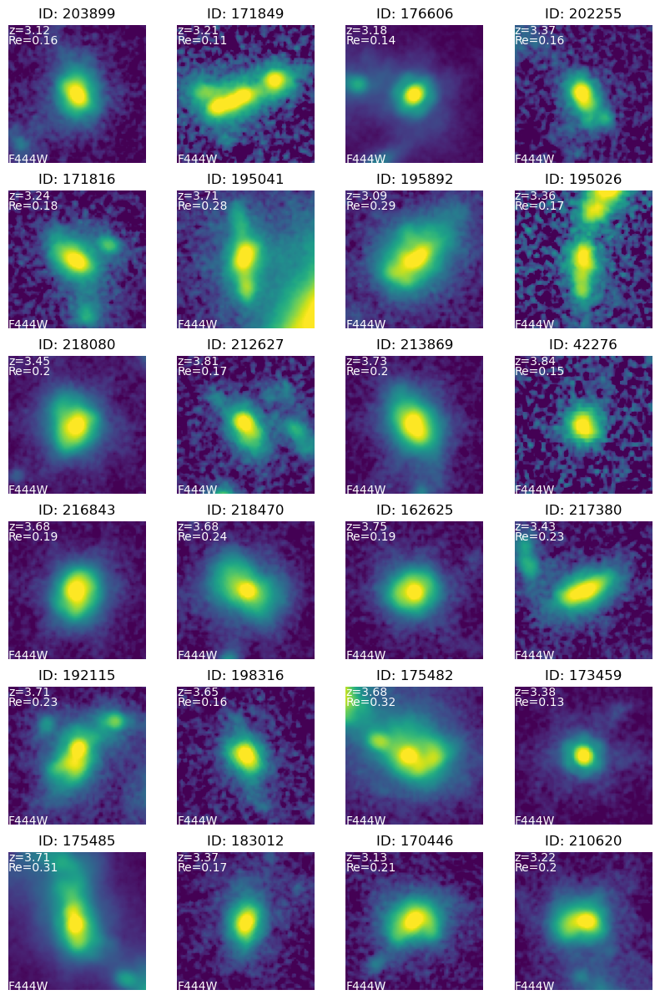

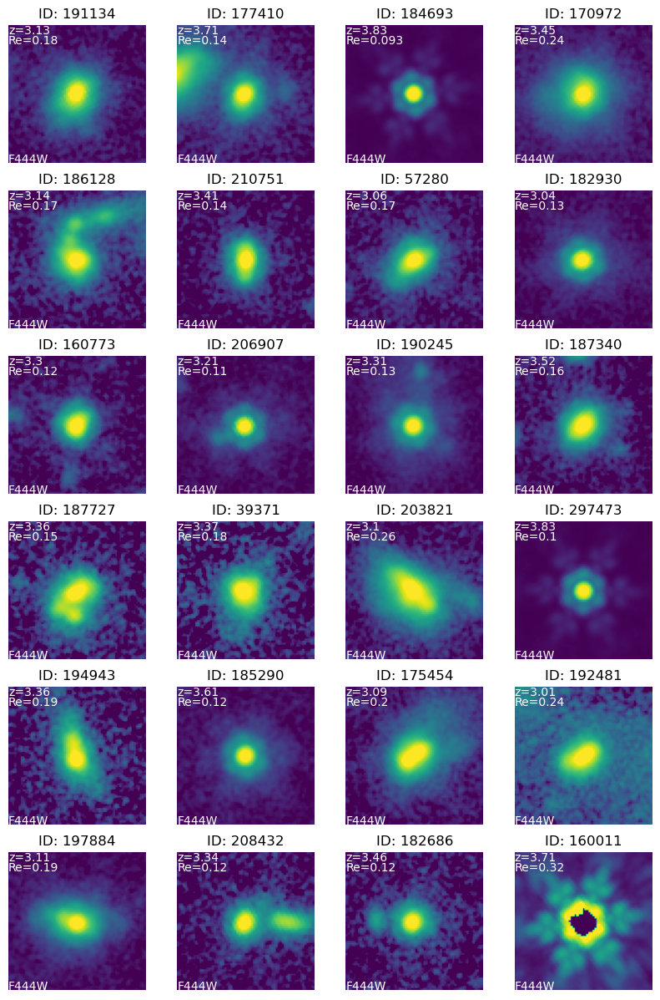

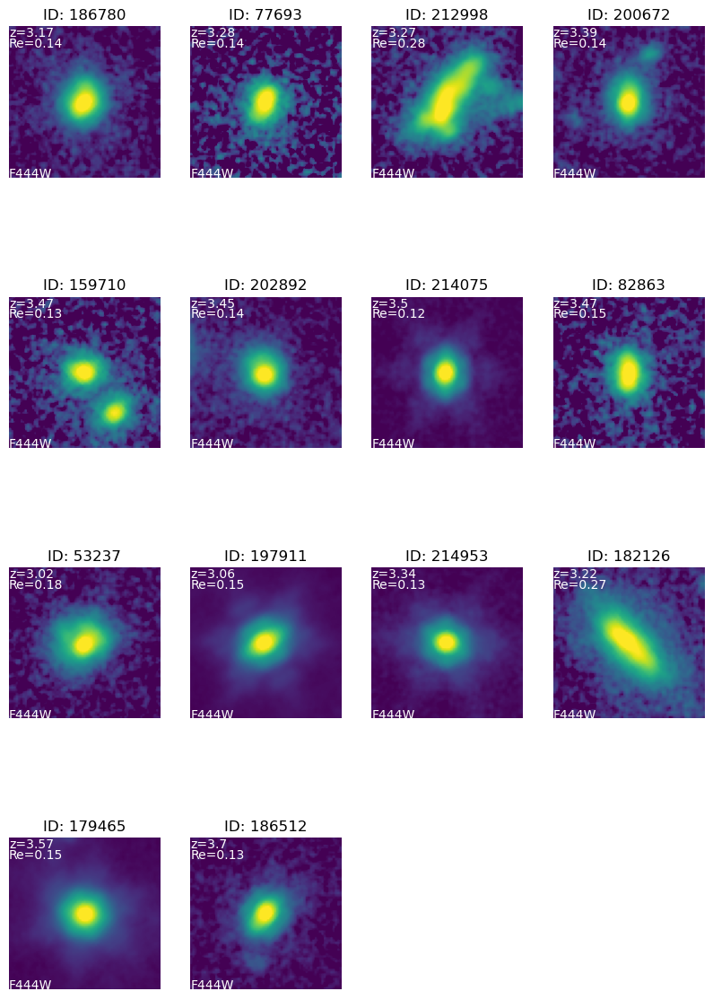

In [37]:
it=0

with PdfPages(res_dir+f'gal_cutouts_F444W.pdf') as pdf:
    
    fig=plt.figure(figsize=(10,15))
    n=0
    
    for file in cuts[0:24]:
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_444[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        #ax.set_xlabel('RA')
        #ax.set_ylabel('DEC')
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F444W', transform=ax.transAxes, **text_kwargs)

        it=it+1

    pdf.savefig(bbox_inches="tight")
    
    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[24:48]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_444[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[48:72]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_444[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[72:96]:
    
        n=n+1
        ax = fig.add_subplot(6,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_444[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")

    n=0
    fig=plt.figure(figsize=(10,15))
    for file in cuts[96:111]:
    
        n=n+1
        ax = fig.add_subplot(4,4,n)
        
        #data from file:
        image=cuts_dir_2+f"{file}"
        hdu_image=fits.open(image)
        header=hdu_image[1].header
        wcs=WCS(header)
    
        #data to put in text:
        rs=z[it]
        r=ref_444[it]
        gid=gal_id[it]

        #normalization of data:
        #img_max=5e-1
        img_max=0.6*np.max(hdu_image[1].data)
        norm = simple_norm(hdu_image[1].data, 'log', log_a=70, min_cut=0, max_cut=img_max)
    
        #plotting figures:
        #fig,ax=plt.subplots(figsize=(3,3),subplot_kw={'projection': wcs})
        ax.axis('off')
        ax.set_title(f'ID: {gid}')
        ax.imshow(hdu_image[1].data, origin='lower', cmap='viridis', norm=norm)

        #text:
        text_kwargs = dict(ha='left', va='top', fontsize=10, color='white')
        ax.text(0, 1, f'z={rs}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.93, f'Re={r:.2}', transform=ax.transAxes, **text_kwargs)
        ax.text(0, 0.07, f'F444W', transform=ax.transAxes, **text_kwargs)
        
        it=it+1
    
    pdf.savefig(bbox_inches="tight")